# MCMC using backward filtering, forward guiding for 3D shapes, SDE transitions

Parameter inference for trees with Gaussian transitions along edges and observations at the leaf nodes for landmark represented shapes. Please refer to the notebook [mcmc_Gaussian_BFFG_shapes_SDES.ipynb](mcmc_Gaussian_BFFG_shapes_SDEs.ipynb) and [mcmc_Gaussian_BFFG_shapes_state-dependent_covariance_3D.ipynb](mcmc_Gaussian_BFFG_shapes_state-dependent_covariance_3D.ipynb) simpler versions. 

The covariance is assumed rotationally invariant, allowing factorization into a kernel product the identity matrix of the ambient space.

The conditioning and upwards/downwards message passing and fusing operations follow the backward filtering, forward guiding approach of Frank van der Meulen, Moritz Schauer et al., see https://arxiv.org/abs/2010.03509 and https://arxiv.org/abs/2203.04155 . The latter reference provides an accesible introduction to the scheme and the notation used in this example. The notation, likelihood ratio calculation etc. follow https://arxiv.org/abs/2203.04155 section 6.1.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import jax
jax.config.update("jax_enable_x64", True)
from jax import numpy as jnp
from jax.random import PRNGKey, split

from hyperiax.tree.topology import symmetric_topology
from hyperiax.tree import HypTree

from hyperiax.plotting import plot_tree_text, plot_shape_3d, plot_tree_3d_scatter, plot_tree_3d_shape, plot_mesh

from hyperiax.mcmc import ParameterStore, VarianceParameter
from hyperiax.mcmc.metropolis_hastings import metropolis_hastings
from hyperiax.mcmc.plotting import trace_plots

from examples.SDE import dot, solve
from examples.ABFFG import *
from examples.shape import k_K2
from examples.shape import mesh_sphere

import matplotlib.pyplot as plt

In [3]:
# seed,
#seed = 42
import os; seed = int(os.urandom(5).hex(), 16)
print("seed: ",seed)
key = PRNGKey(seed)

seed:  773648267371


# Shape related setup

Minimum pairwise distance between the 42 points: 0.5465330578253433


<Axes3D: xlabel='X', ylabel='Y', zlabel='Z'>

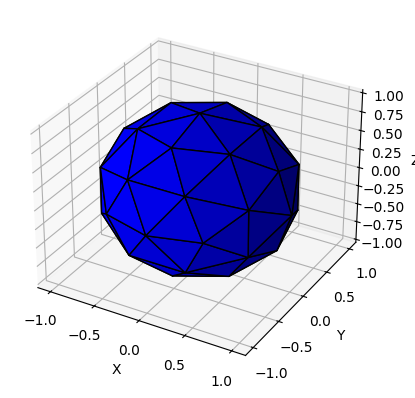

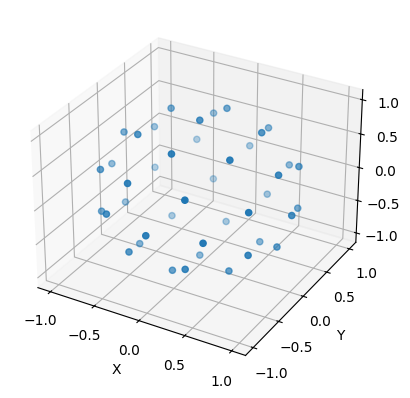

In [4]:
# define shape and plot
d = 3; n = 42 # d = dimension of embedding space, n = number of landmarks

# Create and plot meshed sphere
meshed_sphere = mesh_sphere(n)
def plot_mesh_points(points):
    meshed_sphere.vertices = points.reshape((-1,3))
    plot_mesh(meshed_sphere)
root = meshed_sphere.vertices.flatten()
# Compute minimum pairwise distance between points in root
vertices = root.reshape((-1,d)); n = vertices.shape[0]
diffs = vertices[:,jnp.newaxis,:] - vertices[jnp.newaxis,:,:]
# Compute Euclidean distances and mask the diagonal (zero distances)
distances = jnp.sqrt(jnp.sum(diffs**2, axis=2))
min_dist = jnp.min(distances+ jnp.eye(distances.shape[0])*10)
print(f"Minimum pairwise distance between the {n} points: {min_dist}")

ax = plot_mesh_points(root)
plot_shape = plot_shape_3d
plot_shape(root)

# SDE setup

In [5]:
n_steps = 100 # number of time steps in the discretization

 # drift
def b(t,x,params): return jnp.zeros(n*d)

# diffusion and covariance specification for shape processes
# assumes same covariance in all directions (x,y or x,y,z), thus allowing some factorization of the covariance matrix

kQ12 = lambda x,params: (.25/max(42,n))*k_K2(x,params)

# evaluate k on two pairs of landmark configurations
kQ12_q = lambda q1,q2,params: kQ12(q1.reshape((-1,d))[:,jnp.newaxis,:]-q2.reshape((-1,d))[jnp.newaxis,:,:],params)

# diffusion field and covariance matrix factored in dimensions
sigma = lambda q,theta: kQ12_q(q,q,theta) # diffusion field, kernel evaluated on all landmark pairs
def a(q,theta): sigmaq = sigma(q,theta); return jnp.einsum('ij,kj->ik',sigmaq,sigmaq) # covariance

# Tree with SDE transitions

First, we initialize the tree. We set the root to the shape defined above.

In [6]:
# create topology and tree
#degree = 2; topology = symmetric_topology(height=3, degree=degree)
degree = 5; topology = symmetric_topology(height=2, degree=degree)
plot_tree_text(topology)
tree = HypTree(topology)
print(tree)
n_leaves = tree.is_leaf.sum()

# add properties to tree
tree.add_property('edge_length', shape=())
n_edges = tree.data['edge_length'].shape[0]
# data dimension
tree.add_property('value', shape=(n_steps+1,n*d,))
tree.add_property('noise', shape=(n_steps,n*d))

# set edge lengths on all nodes
tree.data['edge_length'] = jnp.ones_like(tree.data['edge_length'])

# root value
print(tree.data['value'].shape,root.shape)
tree.data['value'] = tree.data['value'].at[0].set(root)

                                                            None
           ┌────────────────────────┬────────────────────────┼────────────────────────┬────────────────────────┐
          None                     None                     None                     None                     None          
 ┌────┬────┼────┬────┐    ┌────┬────┼────┬────┐    ┌────┬────┼────┬────┐    ┌────┬────┼────┬────┐    ┌────┬────┼────┬────┐  
None None None None None None None None None None None None None None None None None None None None None None None None None
HypTree(size=31, levels=3, leaves=25, inner nodes=5)
(31, 101, 126) (126,)


We then define parameters for the Gaussian transition kernel.

In [7]:
# parameters, variance and observation noise
params = ParameterStore({
    'k_alpha': VarianceParameter(.3), # kernel amplitude, governs global tree variance
    'k_sigma': VarianceParameter(.25), # kernel width, for Gaussian kernels this is proportional to the variance
    'obs_var': VarianceParameter(1e-3) # observation noise variance
    })

Now follows the down transitions using the SDE functions above. The step covariance is square of the pairwise kernel evaluations in `sigma(params)` times the variance parameter times edge lengths.

In [8]:
# unconditional down
down_unconditional = SDE_down_unconditional(n_steps,b,sigma)

We can now draw noise and perform a downwards pass. This gives values at all nodes of the tree. Note that observation noise is not added to the leaves yet.

In [9]:
# sample new noise
subkey, key = split(key)
update_noise(tree,subkey)
down_unconditional.down(tree,params.values())

Add uncorrelated observation noise to leaves.



In [10]:
# add noise to leaf nodes
key, subkey = split(key)
add_leaf_noise(tree,key,params)
leaf_values = tree.data['value'][tree.is_leaf][:,-1]

Plot a generated tree.

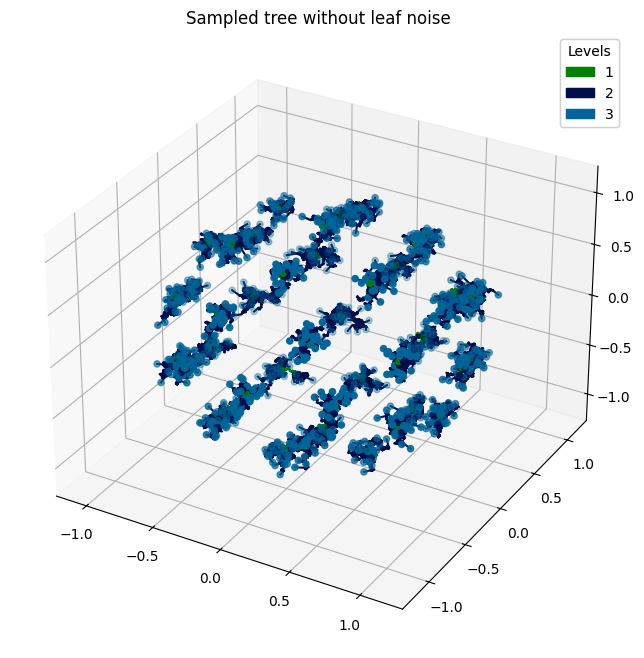

In [11]:
fig = plt.figure(figsize=(10,8)); ax = fig.add_subplot(projection='3d')
plot_tree_3d_scatter(tree,'value',selector=lambda z: z.reshape((-1,n,d)),ax=ax)
plt.gca().set_title('Sampled tree without leaf noise')
plt.show()

fig = plot_tree_3d_shape(tree,'value',scale=.5,mesh=meshed_sphere)
#fig.write_html('dtree.html')
fig.show()

# Backwards filtering, forward guiding

We now define the backwards filter through the up function. The Gaussian are parametrized in the $(c,F,H)$ format make the fuse just a sum of the results of the up operation. See https://arxiv.org/abs/2203.04155 for details.

In [12]:
# backwards filter
up = SDE_up(n_steps,a)

We initialize the tree for up by computing the $c,F,H$-values at the leaves.

In [13]:
# initialize tree
init_up = get_init_up(n,tree,d=d,root=root,n_steps=n_steps)

We can now define the conditional downwards pass, i.e. the forwards guiding.

In [14]:
# conditional down
down_conditional = SDE_down_conditional(n_steps,b,sigma,a)

We make an upwards pass and a downwards conditional sampling to test. Subsequently, we time the three operations (uncondtional down, conditional down, and up).

In [15]:
# backwards filter and fowards guiding, time the operations
test_up_down(down_unconditional,down_conditional,up,init_up,tree,params,leaf_values,key)

Time elapsed: 233.5360 ms
Time elapsed: 298.4889 ms
Time elapsed: 3.1250 ms


# MCMC

MCMC run incorporating the likelihood ratios arising from the Gaussian approximation.

Initial parameters:  {'k_alpha': 0.5, 'k_sigma': 0.1, 'obs_var': 0.0005}
data parameters:  {'k_alpha': 0.3, 'k_sigma': 0.25, 'obs_var': 0.001}


100%|██████████| 1000/1000 [05:14<00:00,  3.18it/s]

Acceptance rate: 0.2240


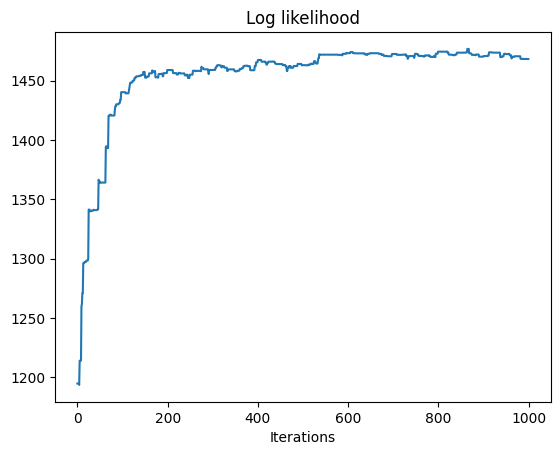

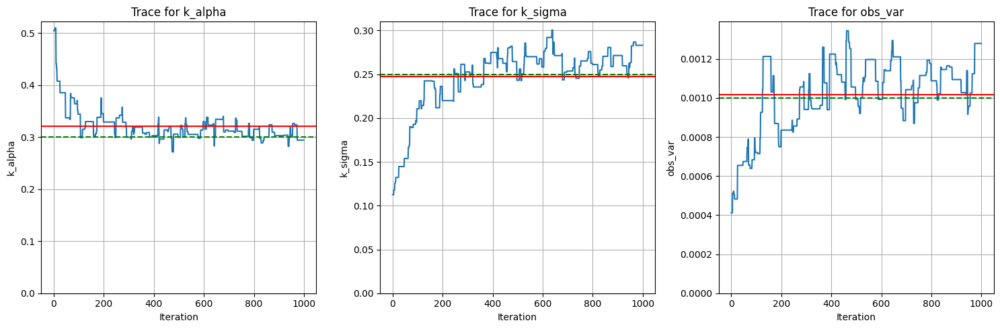

In [16]:
log_likelihood = get_log_likelihood(tree,down_conditional,up,init_up)
log_posterior = get_log_posterior(log_likelihood)
proposal = get_proposal(tree)

# tree values and parameters
init_params = ParameterStore({
    'k_alpha': VarianceParameter(.5,alpha=2.,beta=.5), # kernel amplitude, governs global tree variance
    'k_sigma': VarianceParameter(.1), # kernel width, for Gaussian kernels this is proportional to the variance
    'obs_var': VarianceParameter(.5*1e-3,min=1e-4,max=.1,prior='uniform',keep_constant=False) # observation noise variance
    })
print("Initial parameters: ",init_params.values())
print("data parameters: ",params.values())

# initial state
init_state = (init_params,(jnp.zeros_like(tree.data['noise']),tree.data['v_T']))

# Run Metropolis-Hastings
subkey, key = split(key)
log_likelihoods, samples = metropolis_hastings(log_posterior, proposal, leaf_values, init_state, 1000, burn_in=000, rng_key=key, savef=lambda state: state[0])

# plot
plt.plot(log_likelihoods)
plt.xlabel("Iterations")
plt.title('Log likelihood')
trace_plots(samples,params.values())

Prior is maximized at x = 0.16245454545454546
Prior is maximized at x = 0.4954545454545455
Prior is maximized at x = 0.0001


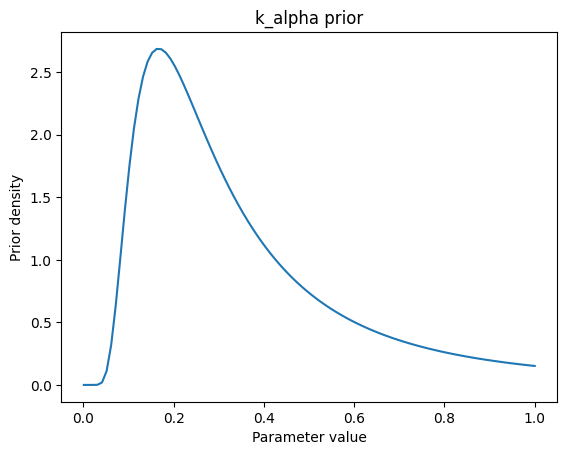

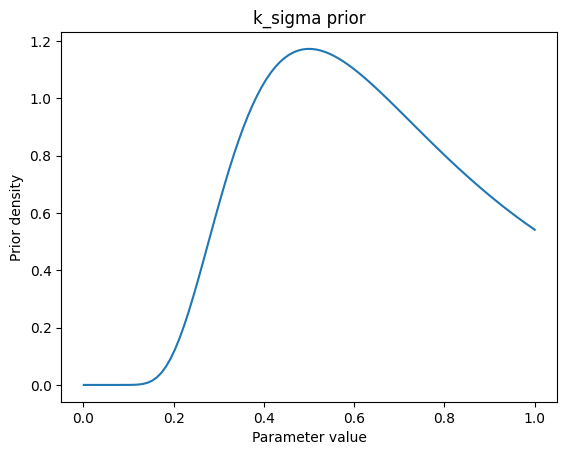

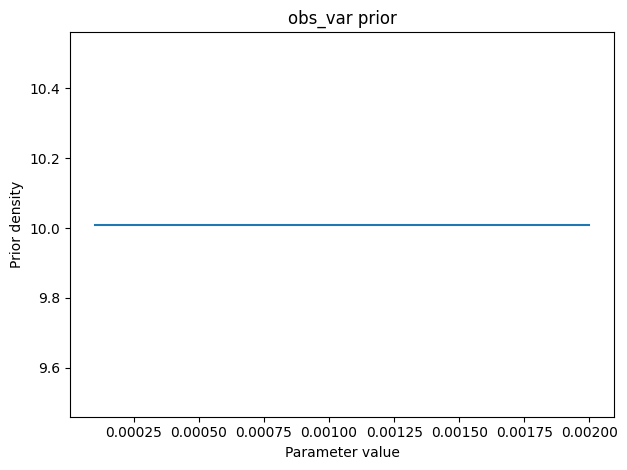

In [17]:
# Plot priors for all initial parameters
init_params['k_alpha'].plot_prior()
plt.title('k_alpha prior')

init_params['k_sigma'].plot_prior()
plt.title('k_sigma prior')

init_params['obs_var'].plot_prior(x_min=1e-4,x_max=2*1e-3)
plt.title('obs_var prior')

plt.tight_layout()